In [1]:
using Pkg


In [2]:
Pkg.activate("/home/samith/julia_envs/md_gpu")

  Activating project at `~/julia_envs/md_gpu`


Saved PNG: /home/samith/notebooks/xmas_tree_billboard.png
Saved GIF: /home/samith/notebooks/xmas_tree_billboard.gif


PNG preview
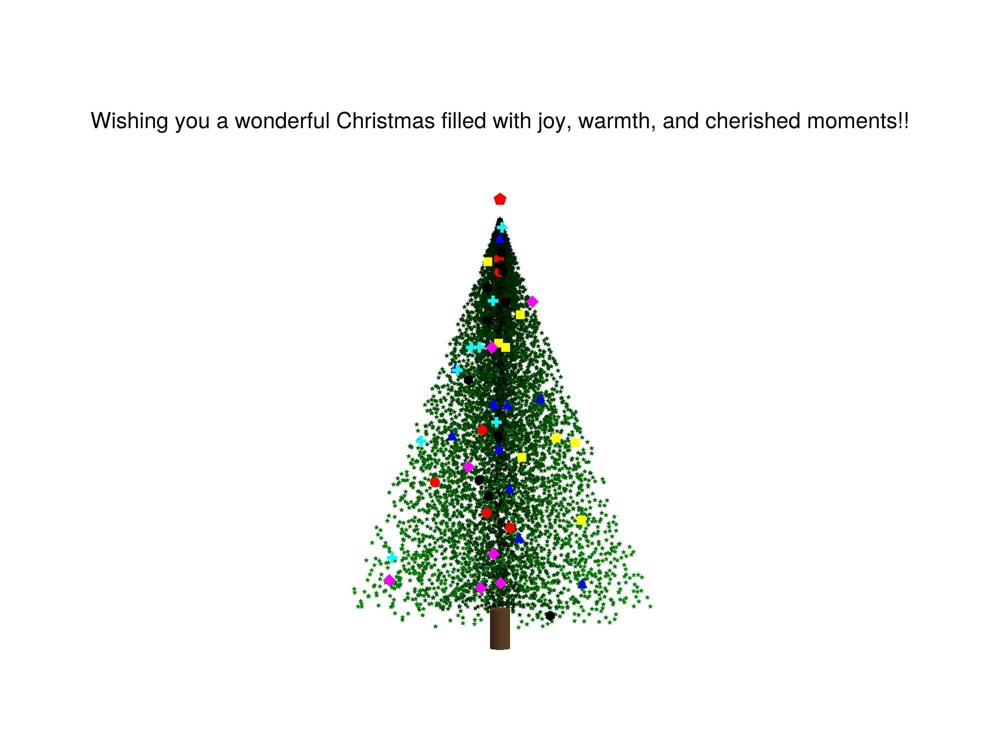

GIF preview
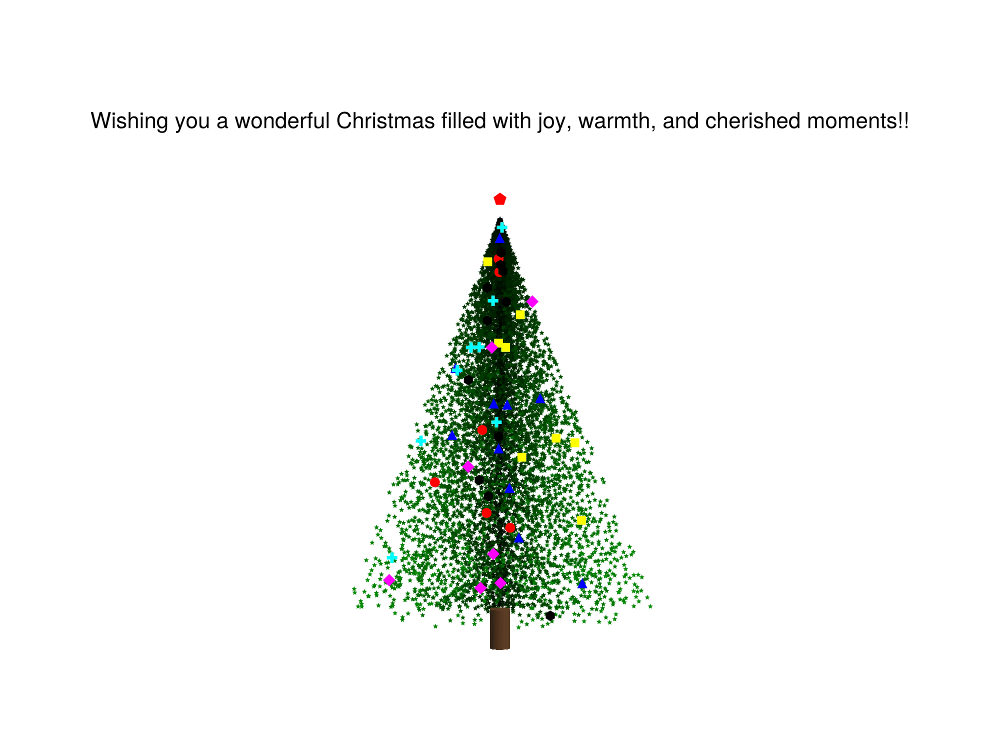

In [3]:
using CairoMakie
using Colors
using Random
using GeometryBasics
using Base64

# Use Cairo backend (best for saving PNG/GIF reliably)
CairoMakie.activate!()

# ==========================================================
# PARAMETERS (edit these only)
# ==========================================================
P = (;
    # ---------- Output ----------
    outdir   = "/home/samith/notebooks",
    png_name = "xmas_tree_billboard.png",
    gif_name = "xmas_tree_billboard.gif",

    # ---------- Randomness ----------
    # Set seed = nothing for a new random tree each run
    seed = 1234,

    # ---------- Animation / Camera ----------
    fps          = 20,   # frames per second
    step_deg     = 5,    # degrees per frame (bigger = faster rotation)
    revolutions  = 1,    # full 360° turns
    start_az_deg = 3,    # starting azimuth (deg)
    elev_deg     = 9,    # fixed elevation (deg)

    # ---------- Figure size ----------
    fig_w = 1000,
    fig_h = 750,

    # ---------- Billboard message (3D) ----------
    show_message = true,
    message      = "Wishing you a wonderful Christmas filled with joy, warmth, and cherished moments!!",

    # Billboard anchor position in DATA coordinates (x,y,z)
    message_pos  = Point3f(0f0, 0.0f0, 1.22f0),

    # Wrapping width in pixels (increase for fewer line breaks)
    wrap_px      = 860,

    # Message style
    msg_fontsize = 22,
    msg_bg_alpha = 0.70,   # background transparency (0..1)
    msg_padding  = 10,     # padding inside background box (px)

    # ---------- Tree appearance ----------
    ornaments_total   = 50,   # total ornaments across 6 styles
    tree_marker_size  = 6,
    ornament_size     = 14,
    top_star_size     = 18,

    # ---------- Stable framing (prevents GIF jitter) ----------
    xlim = (-0.55, 0.55),
    ylim = (-0.55, 0.55),
    zlim = (-0.15, 1.35),
)
# ==========================================================

# ---------------- Paths ----------------
mkpath(P.outdir)
png_path = joinpath(P.outdir, P.png_name)
gif_path = joinpath(P.outdir, P.gif_name)

# ---------------- Random seed ----------------
if P.seed !== nothing
    Random.seed!(P.seed)
end

# ---------------- Data ----------------
# N = number of points forming the “tree cloud”
N = 6^5

# c = number of ornaments total
c = P.ornaments_total

# k = ornament style index (1..6) for each ornament
k = rand(1:6, c)

# l = indices of points that will become ornaments
l = randperm(N)[1:c]

# helper: N random numbers in [0,1)
q() = rand(N)

# a = random angles around z-axis (0..2π)
a = q() .* (2π)

# z = random heights (0..1)
z = q()

# r = cone radius vs height (bigger at bottom, smaller at top)
r = 0.4 .* (1 .- z)

# t = extra random scaling (fills volume)
t = q()

# base circle coordinates
x = r .* cos.(a)
y = r .* sin.(a)

# green intensity (contrast controlled by exponent)
g = (t .* r) .^ 0.6
col = RGBf.(0f0, Float32.(g), 0f0)

# Ornament styles: (color, marker)
styles = (
    (:red,     :circle),
    (:yellow,  :rect),
    (:magenta, :diamond),
    (:blue,    :utriangle),
    (:black,   :hexagon),
    (:cyan,    :cross),
)

# ---------------- Figure ----------------
fig = Figure(size = (P.fig_w, P.fig_h))
ax  = Axis3(fig[1, 1], aspect = :data)

# Hide axis decorations for a clean look
hidedecorations!(ax)
hidespines!(ax)

# ---------------- Tree points ----------------
scatter!(ax, x .* t, y .* t, z;
    color      = col,
    marker     = :star5,
    markersize = P.tree_marker_size
)

# ---------------- Top star ----------------
scatter!(ax, [0.0], [0.0], [1.05];
    color      = :red,
    marker     = :pentagon,
    markersize = P.top_star_size
)

# ---------------- Ornaments ----------------
# Ornaments must use same scaling as tree (.* t)
for i in 1:6
    L = l[k .== i]
    ccol, mkr = styles[i]
    scatter!(ax, x[L] .* t[L], y[L] .* t[L], z[L];
        color      = ccol,
        marker     = mkr,
        markersize = P.ornament_size
    )
end

# ---------------- Trunk ----------------
radius = 0.025f0
trunk_top    = Point3f(0f0, 0f0, 0f0)
trunk_bottom = Point3f(0f0, 0f0, -0.1f0)
trunk = GeometryBasics.Cylinder(trunk_bottom, trunk_top, radius)

mesh!(ax, trunk;
    color   = RGBAf(0.45f0, 0.30f0, 0.18f0, 1.0f0),
    shading = true
)

# ---------------- Stable limits ----------------
xlims!(ax, P.xlim...)
ylims!(ax, P.ylim...)
zlims!(ax, P.zlim...)

# ---------------- Camera view ----------------
ax.azimuth[]   = deg2rad(P.start_az_deg)
ax.elevation[] = deg2rad(P.elev_deg)

# ---------------- Billboard message (3D) ----------------
# NOTE: In your Makie version, `text!` doesn't support background/padding/billboard.
# Use `textlabel!` instead (text + background box + padding + wrapping).
if P.show_message
    textlabel!(ax, [P.message_pos];
        text = [P.message],

        fontsize   = P.msg_fontsize,
        text_color = :black,
        text_align = (:center, :bottom),

        background_color = RGBAf(1f0, 1f0, 1f0, Float32(P.msg_bg_alpha)),
        strokewidth      = 0,
        padding          = P.msg_padding,

        word_wrap_width  = P.wrap_px,

        # helps keep it visible on top of 3D scene
        draw_on_top      = true
    )
end

# ---------------- Save PNG ----------------
save(png_path, fig)

# ---------------- Save GIF ----------------
total_degrees = 360 * P.revolutions
angles = P.start_az_deg:P.step_deg:(P.start_az_deg + total_degrees)

record(fig, gif_path, angles; framerate = P.fps) do ang
    ax.azimuth[]   = deg2rad(ang)
    ax.elevation[] = deg2rad(P.elev_deg)
end

println("Saved PNG: ", png_path)
println("Saved GIF: ", gif_path)

# ---------------- Display in classic Jupyter (HTML base64) ----------------
function show_png(path; maxwidth=900)
    isfile(path) || error("PNG not found: $path")
    b64 = base64encode(read(path))
    display("text/html",
        "<div>
           <h3>PNG preview</h3>
           <img style='max-width:$(maxwidth)px; border:1px solid #ddd;' src='data:image/png;base64,$b64' />
         </div>"
    )
end

function show_gif(path; maxwidth=900)
    isfile(path) || error("GIF not found: $path")
    b64 = base64encode(read(path))
    display("text/html",
        "<div style='margin-top:14px'>
           <h3>GIF preview</h3>
           <img style='max-width:$(maxwidth)px; border:1px solid #ddd;' src='data:image/gif;base64,$b64' />
         </div>"
    )
end

show_png(png_path)
show_gif(gif_path)
